# 📌 Submission Guidelines

### ✅ File Naming Rule  
Submit your notebook with the following format:

`StudentID_YourFullName_LABXX.ipynb`

or

`StudentID_YourFullName_LABXX.html`

**Examples (Correct):**
- `21113456_NguyenVanA_LAB01.ipynb`
- `19122233_TranThiB_LAB02.ipynb`

**Examples (Wrong → 0 points):**
- `Lab01.ipynb`
- `YourName.ipynb`
- `20123456.ipynb`
- `Lab01.pdf`

---

### 📌 Grading Policy

- ❌ Wrong filename format, missing submission, or **plagiarism (code identical to others)** → 0 points

- ⚠️ Submitting a file without results, incomplete work, or only the assignment description → Maximum 4 points

- ✅ Correct filename + Completed results → Graded normally based on assignment quality (accuracy, clarity, and originality)  

### Note:
- AI assistance is allowed, but you must write the code yourself. All submissions will be checked for originality.


---

# Goal: Edge detection

Edge detection includes a variety of mathematical methods that aim at identifying edges, defined as curves in a digital image at which the image brightness changes sharply or, more formally, has discontinuities. The same problem of finding discontinuities in one-dimensional signals is known as step detection and the problem of finding signal discontinuities over time is known as change detection. Edge detection is a fundamental tool in image processing, machine vision and computer vision, particularly in the areas of feature detection and feature extraction.

# Code Sample

In [30]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import urllib.request
import os
import numpy as np
from scipy import ndimage
from skimage import feature

In [31]:
!gdown 1zHt_y6Vul1suVnXYF20oTJt6xaFCcDnL
!gdown 1sjT0fkxVLFhIVYrFOraQpH5_c8RrIZ2Z
!gdown 1N8V3alWm7i5lwY9tvCrVaLYsvhnhtaMJ

Downloading...
From: https://drive.google.com/uc?id=1zHt_y6Vul1suVnXYF20oTJt6xaFCcDnL
To: d:\Xu_ly_anh\(4-1).jpeg

  0%|          | 0.00/62.9k [00:00<?, ?B/s]
100%|██████████| 62.9k/62.9k [00:00<00:00, 583kB/s]
100%|██████████| 62.9k/62.9k [00:00<00:00, 582kB/s]
Downloading...
From: https://drive.google.com/uc?id=1sjT0fkxVLFhIVYrFOraQpH5_c8RrIZ2Z
To: d:\Xu_ly_anh\(4-2).jpeg

  0%|          | 0.00/119k [00:00<?, ?B/s]
100%|██████████| 119k/119k [00:00<00:00, 715kB/s]
100%|██████████| 119k/119k [00:00<00:00, 714kB/s]
Downloading...
From: https://drive.google.com/uc?id=1N8V3alWm7i5lwY9tvCrVaLYsvhnhtaMJ
To: d:\Xu_ly_anh\(4-3).jpeg

  0%|          | 0.00/70.9k [00:00<?, ?B/s]
100%|██████████| 70.9k/70.9k [00:00<00:00, 645kB/s]
100%|██████████| 70.9k/70.9k [00:00<00:00, 644kB/s]


In [32]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))

  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # If the channel number is less than 3, we display as grayscale image
      # otherwise, we display as color image
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowFourImages(IM1, IM2, IM3, IM4):
    imshows([IM1, IM2, IM3, IM4], ["Image 1","Image 2", "Image 3", "Image 4"], 2, 2)
def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

In [33]:
img1_path = r"D:\Xu_ly_anh\content\Mulcharmy Fuwalos.jpg"
img2_path = r"D:\Xu_ly_anh\content\Mulcharmy Purulia.jpg"
img3_path = r"D:\Xu_ly_anh\content\Mulcharmy Meowls.jpg"

assert os.path.exists(img1_path), f"File {img1_path} does not exist"
assert os.path.exists(img2_path), f"File {img2_path} does not exist"
assert os.path.exists(img3_path), f"File {img3_path} does not exist"

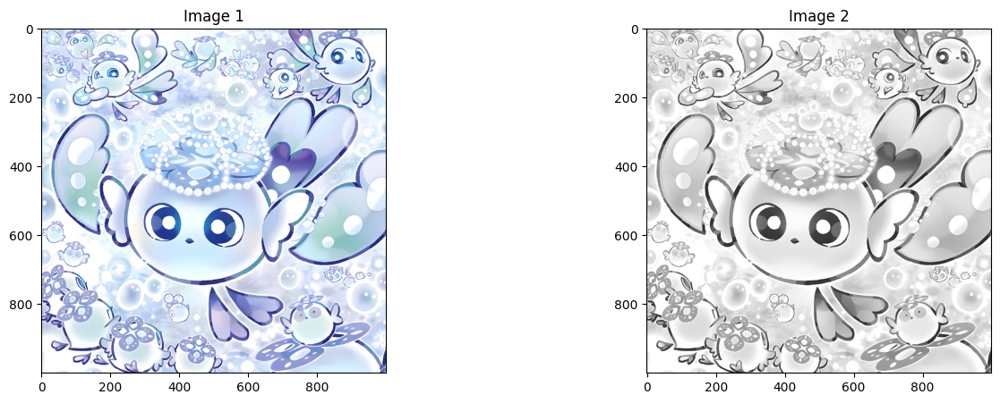

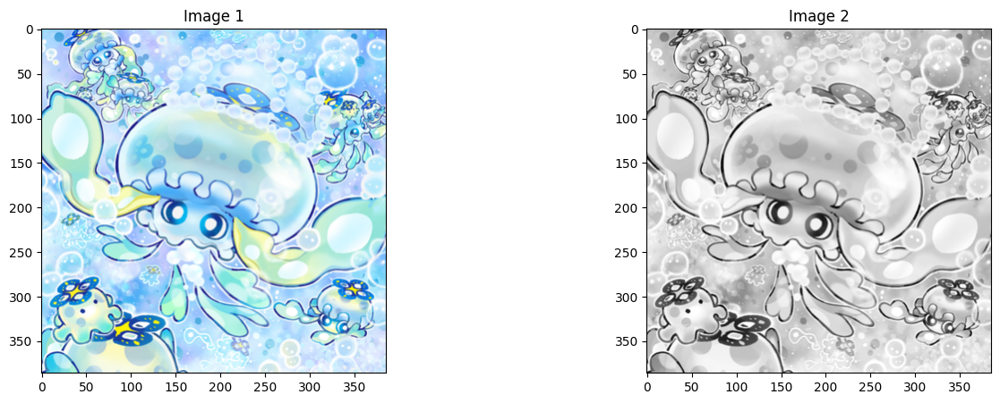

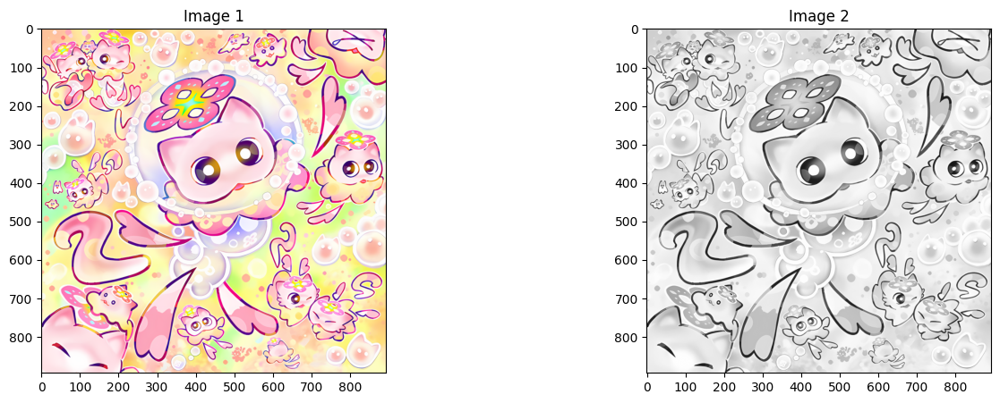

In [34]:
img1 = cv.imread(img1_path)
img2 = cv.imread(img2_path)
img3 = cv.imread(img3_path)


img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)
img3 = cv.cvtColor(img3, cv.COLOR_BGR2RGB)

img1_gray = cv.cvtColor(img1, cv.COLOR_RGB2GRAY)
img2_gray = cv.cvtColor(img2, cv.COLOR_RGB2GRAY)
img3_gray = cv.cvtColor(img3, cv.COLOR_RGB2GRAY)

ShowTwoImages(img1, img1_gray)
ShowTwoImages(img2, img2_gray)
ShowTwoImages(img3, img3_gray)

##  Using First Order Derivative Methods in Edge Detection

**Using defaut kernel**

Different gradient operators can be applied to estimate image gradients from the input image or a smoothed version of it. The simplest approach is to use central differences:

$$
L_x(x, y) = -\frac{1}{2} L(x-1, y) + 0 \cdot L(x, y) + \frac{1}{2} L(x+1, y)
$$

$$
L_y(x, y) = -\frac{1}{2} L(x, y-1) + 0 \cdot L(x, y) + \frac{1}{2} L(x, y+1)
$$

### **1. Finite Difference Approximations**

**Formulas:**

$$
\frac{\partial I}{\partial x} \approx \frac{1}{2} \left[ \left(I_{i+1,j+1} - I_{i,j+1}\right) + \left(I_{i+1,j} - I_{i,j}\right) \right]
$$

$$
\frac{\partial I}{\partial y} \approx \frac{1}{2} \left[ \left(I_{i+1,j+1} - I_{i+1,j}\right) + \left(I_{i,j+1} - I_{i,j}\right) \right]
$$

**Illustration:**


\begin{vmatrix}
I_{i,j} & I_{i, j+1} \\
I_{i+1, j} & I_{i+1, j+1}
\end{vmatrix}


where:

$h \text{ = spacing between grid points.}$


In [35]:
kernel_defaut_x = np.array([[-1,1],
                            [-1,1]], dtype=np.float32)

kernel_defaut_y = np.array([[1, 1],
                          [-1,-1]], dtype=np.float32)

In [36]:
# Apply defaut kernel operator in X and Y directions
defautx = cv.filter2D(img1, cv.CV_64F, kernel_defaut_x)
defauty =  cv.filter2D(img1, cv.CV_64F, kernel_defaut_y)

# Combine gradients
kernel_defaut_combined = cv.magnitude(defautx, defauty)
kernel_defaut_combined = cv.convertScaleAbs(kernel_defaut_combined)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-392.0..394.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-395.0..392.0].


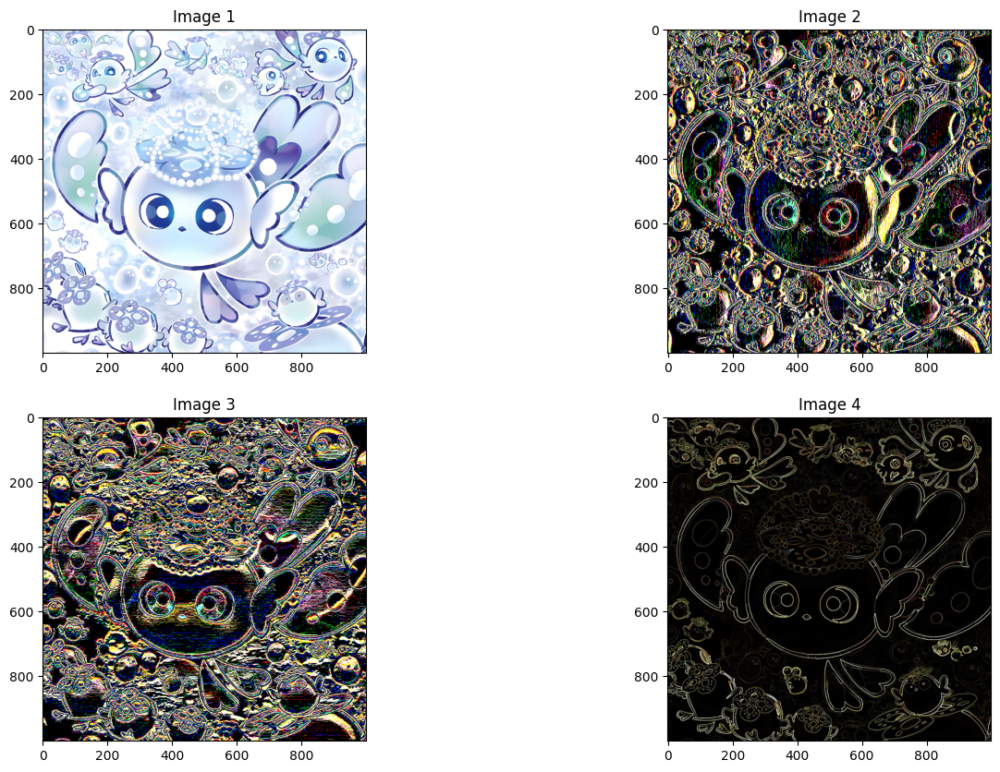

In [37]:
ShowFourImages(img1, defautx, defauty, kernel_defaut_combined)

In [38]:
# Apply defaut kernel operator in X and Y directions
defautx_gray = cv.filter2D(img1_gray, cv.CV_64F, kernel_defaut_x)
defauty_gray =  cv.filter2D(img1_gray, cv.CV_64F, kernel_defaut_y)

# Combine gradients
kernel_defaut_combined_gray = cv.magnitude(defautx_gray, defauty_gray)
kernel_defaut_combined_gray = cv.convertScaleAbs(kernel_defaut_combined)

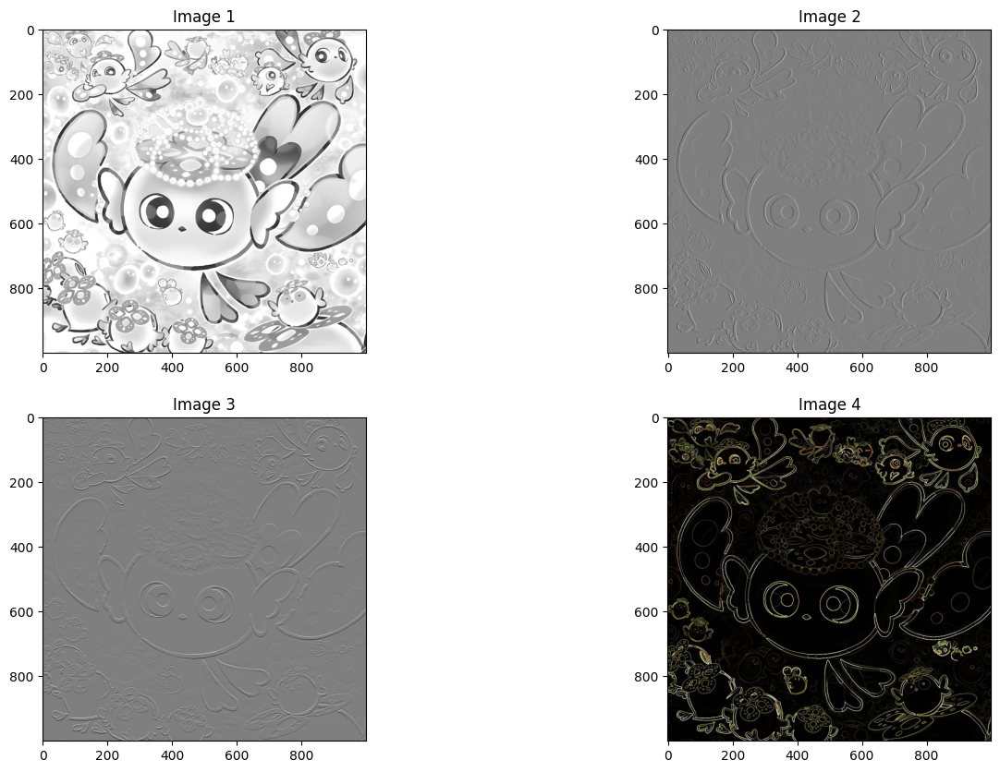

In [39]:
ShowFourImages(img1_gray, defautx_gray, defauty_gray, kernel_defaut_combined_gray)

### **2. Robert Operator**

This gradient-based operator computes the sum of squares of the differences between diagonally adjacent pixels in an image through discrete differentiation. Then the gradient approximation is made. It uses the following 2 x 2 kernels or masks

**Kernels:**
$$
G_x =
\begin{bmatrix}
1 & 0  \\
0 & -1
\end{bmatrix}
\quad
G_y =
\begin{bmatrix}
0 & 1  \\
-1 & 0
\end{bmatrix}
$$

In [40]:
kernel_Robert_x = np.array([[1,0],
                            [0,-1]], dtype=np.float32)

kernel_Robert_y = np.array([[0, 1],
                          [-1,0]], dtype=np.float32)

In [41]:
# Apply Sobel operator in X and Y directions
Robertx = cv.filter2D(img1, cv.CV_64F,kernel_Robert_x)
Roberty = cv.filter2D(img1, cv.CV_64F,kernel_Robert_y)

# Combine gradients
Robert_combined = cv.magnitude(Robertx, Roberty)
Robert_combined = cv.convertScaleAbs(Robert_combined)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-255.0..246.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-252.0..251.0].


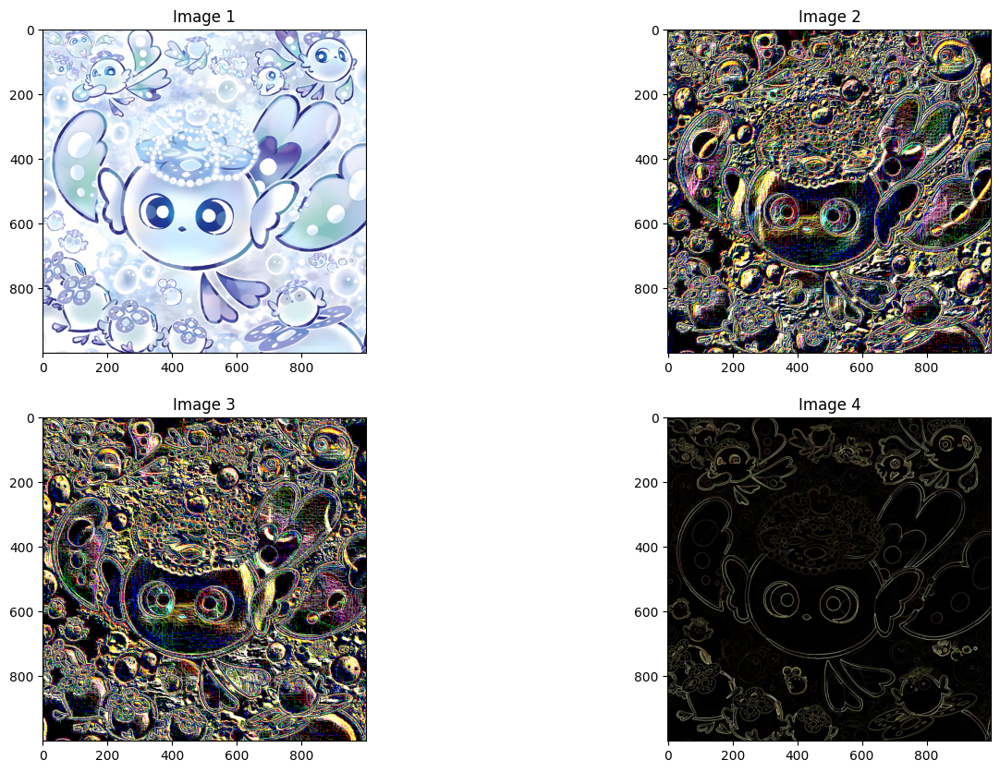

In [42]:
ShowFourImages(img1, Robertx, Roberty, Robert_combined)

In [43]:
Robertx_gray = cv.filter2D(img1_gray, cv.CV_64F,kernel_Robert_x)
Roberty_gray = cv.filter2D(img1_gray, cv.CV_64F,kernel_Robert_y)

Robert_combined_gray = cv.magnitude(Robertx_gray, Roberty_gray)

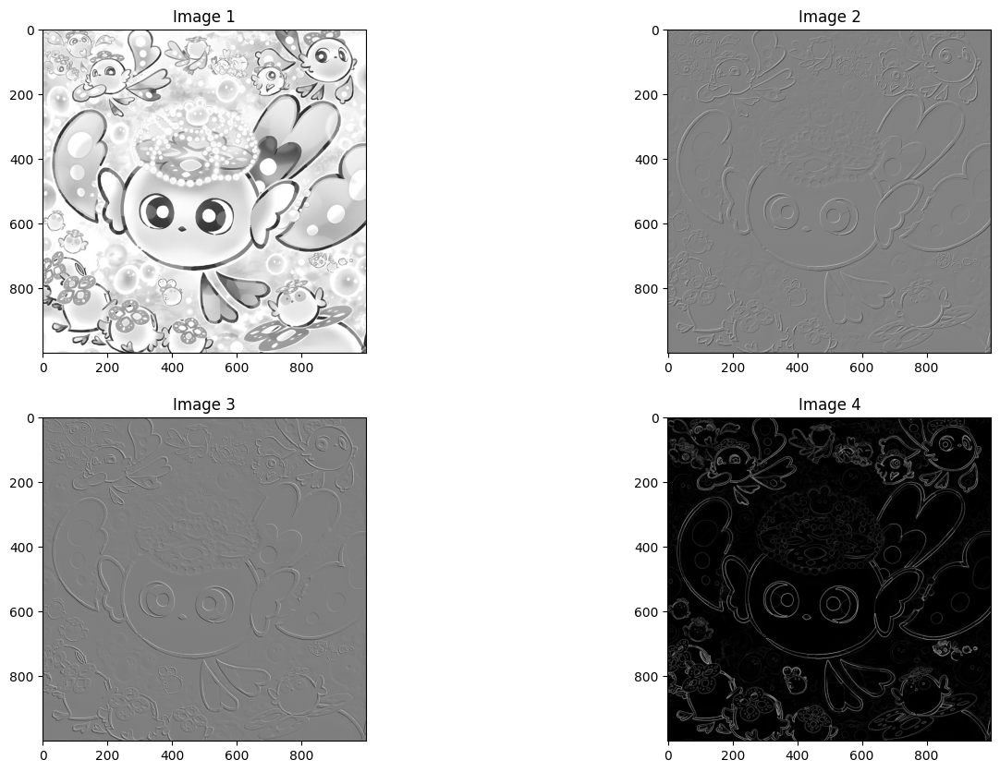

In [44]:
ShowFourImages(img1_gray, Robertx_gray, Roberty_gray, Robert_combined_gray)

### 3. **Prewitt Operator**

The Prewitt operator is a simpler, faster method that applies uniform convolution kernels to calculate gradients in the x and y directions.

Prewitt is expansion version of Robert

Kernels:
$$
G_x =
\begin{bmatrix}
-1 & 0 & +1 \\
-1 & 0 & +1 \\
-1 & 0 & +1
\end{bmatrix}
\quad
G_y =
\begin{bmatrix}
-1 & -1 & -1 \\
0 & 0 & 0 \\
+1 & +1 & +1
\end{bmatrix}
$$


In [45]:
prewittx_kernel = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
prewitty_kernel = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])

In [46]:
prewittx = cv.filter2D(img1, cv.CV_64F, prewittx_kernel)
prewitty = cv.filter2D(img1, cv.CV_64F, prewitty_kernel)

prewitt_combined = cv.magnitude(prewittx.astype(float), prewitty.astype(float))
prewitt_combined = cv.convertScaleAbs(prewitt_combined)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-732.0..730.0].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-735.0..744.0].


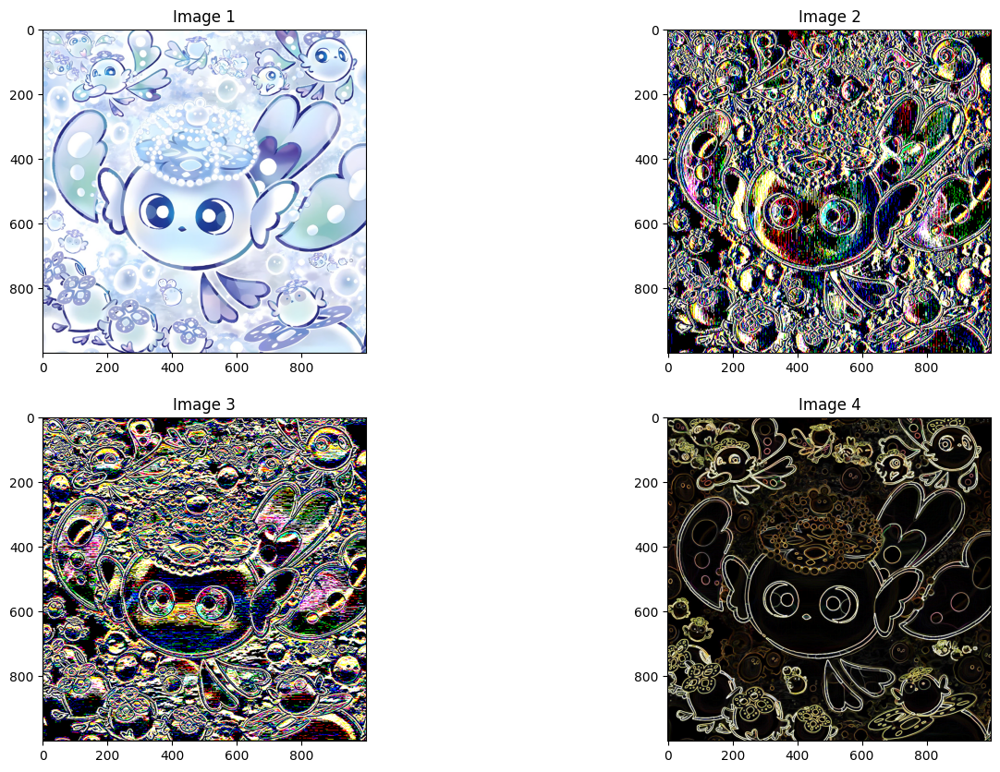

In [47]:
ShowFourImages(img1, prewittx, prewitty, prewitt_combined)

In [48]:
prewittx_gray = cv.filter2D(img1_gray, cv.CV_64F, prewittx_kernel)
prewitty_gray = cv.filter2D(img1_gray, cv.CV_64F, prewitty_kernel)

prewitt_combined_gray = cv.magnitude(prewittx_gray.astype(float), prewitty_gray.astype(float))
prewitt_combined_gray = cv.convertScaleAbs(prewitt_combined_gray)

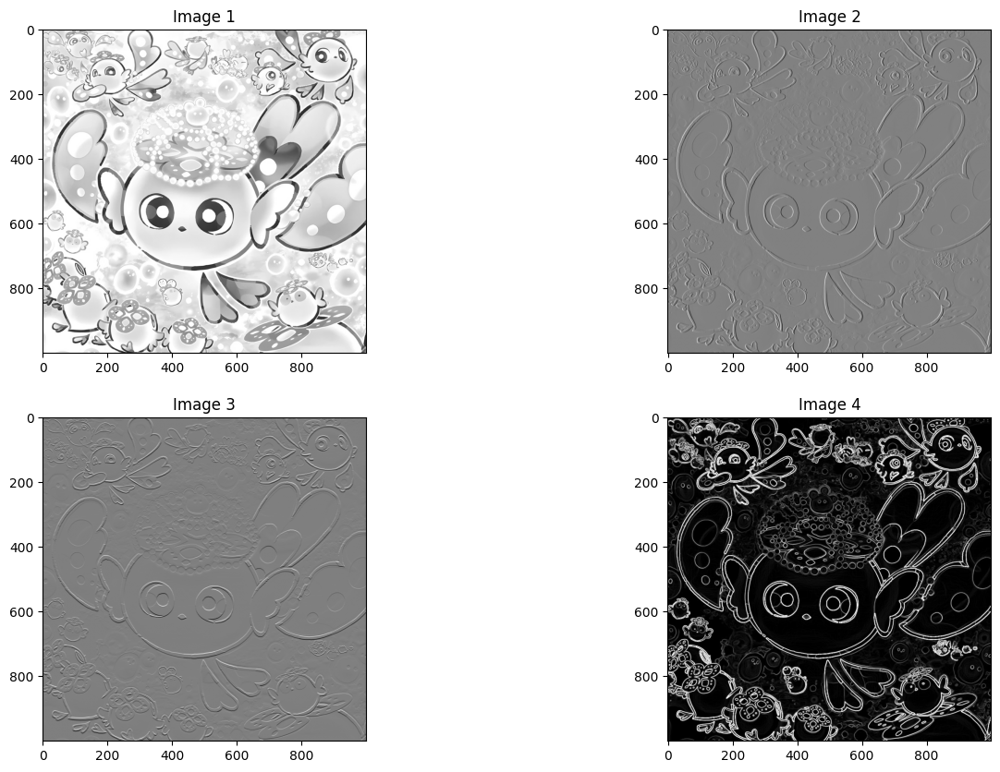

In [49]:
ShowFourImages(img1_gray, prewittx_gray, prewitty_gray, prewitt_combined_gray)

## Using Second Order Derivative Methods in Edge Detection

**Discrete Laplacian (∇²) Operator**

\begin{bmatrix}
I_{i-1, j+1} & I_{i, j+1} & I_{i+1, j+1} \\
I_{i-1, j} & I_{i, j} & I_{i+1, j} \\
I_{i-1, j-1} &I_{i, j-1} & I_{i+1, j-1}
\end{bmatrix}

Finite difference approximations:

$$
\frac{\partial^2 I}{\partial x^2} \approx \frac{1}{\epsilon^2} \left( I_{i-1,j} - 2I_{i,j} + I_{i+1,j} \right)
$$

$$
\frac{\partial^2 I}{\partial y^2} \approx \frac{1}{\epsilon^2} \left( I_{i,j-1} - 2I_{i,j} + I_{i,j+1} \right)
$$

$$
\therefore \nabla^2 I = \frac{\partial^2 I}{\partial x^2} + \frac{\partial^2 I}{\partial y^2}
$$

Convolution Mask:

$$
\nabla^2 \approx \frac{1}{\epsilon^2}
\begin{bmatrix}
0 & 1 & 0 \\
1 & -4 & 1 \\
0 & 1 & 0
\end{bmatrix}
$$
OR
$$
\quad  \quad
\nabla^2 \approx \frac{1}{6\epsilon^2}
\begin{bmatrix}
1 & 4 & 1 \\
4 & -20 & 4 \\
1 & 4 & 1
\end{bmatrix} \quad ⇒ \text{(More Accurate)}
$$


### Original Laplacian + Laplacian of Gaussian (LoG)
The Laplacian of Gaussian combines two mathematical ideas: smoothing with a Gaussian filter and detecting edges with the Laplacian operator.

In [50]:
laplacian_kernel_1 = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
laplacian_kernel_2 = np.array([[1, 4, 1], [4, -20, 4], [1, 4, 1]])

blurred_img2 = cv.GaussianBlur(img2, (3, 3), 2)


In [51]:
laplacian_img1 = cv.filter2D(img2, ddepth=cv.CV_64F, kernel=laplacian_kernel_1)
laplacian_img1_blurred = cv.filter2D(blurred_img2, ddepth=cv.CV_64F, kernel=laplacian_kernel_1)

# Chuyển sang 8-bit để hiển thị
laplacian_img1 = cv.convertScaleAbs(laplacian_img1)
laplacian_img1_blurred = cv.convertScaleAbs(laplacian_img1_blurred)

laplacian_img2 = cv.filter2D(img2, ddepth=cv.CV_64F, kernel=laplacian_kernel_2)
laplacian_img2_blurred = cv.filter2D(blurred_img2, ddepth=cv.CV_64F, kernel=laplacian_kernel_2)
# Chuyển sang 8-bit để hiển thị
laplacian_img2 = cv.convertScaleAbs(laplacian_img2)
laplacian_img2_blurred = cv.convertScaleAbs(laplacian_img2_blurred)


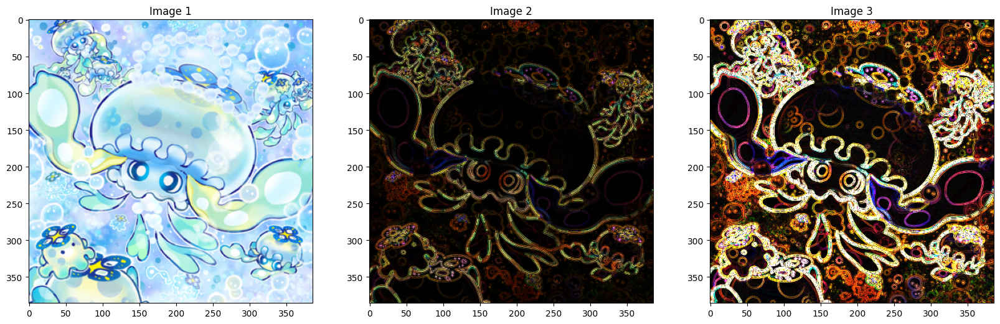

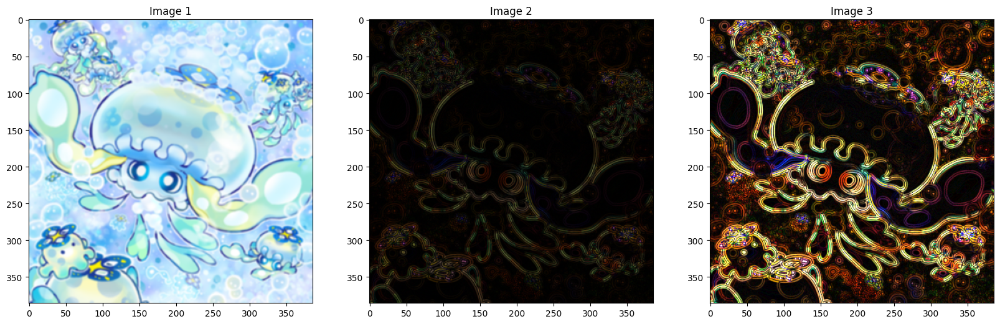

In [52]:
ShowThreeImages(img2, laplacian_img1, laplacian_img2)
ShowThreeImages(blurred_img2, laplacian_img1_blurred, laplacian_img2_blurred)

### Difference of Gaussian (DoG)

Difference of Gaussian is a computationally efficient approximation of the Laplacian of Gaussian.

Instead of explicitly computing ∇²G, the DoG method subtracts two Gaussian-blurred versions of the image using different standard deviations:

$$DoG = G(σ₂) * I − G(σ₁) * I, \, \ with \ σ₂ > σ₁.$$



This works because the derivative of a Gaussian with respect to σ is proportional to its Laplacian:

$$\frac{∂G}{∂σ} ∝ ∇²G$$

A finite-difference approximation of this derivative is:

$$\frac{G(σ₂) − G(σ₁)}{σ₂ − σ₁}$$

which means:

$$DoG ≈ k · LoG$$

Thus, DoG gives nearly the same result as LoG but requires only two Gaussian convolutions and no second-order derivatives. This makes DoG faster and more stable in practical applications. It is used heavily in scale-space feature detection (e.g., the SIFT algorithm).

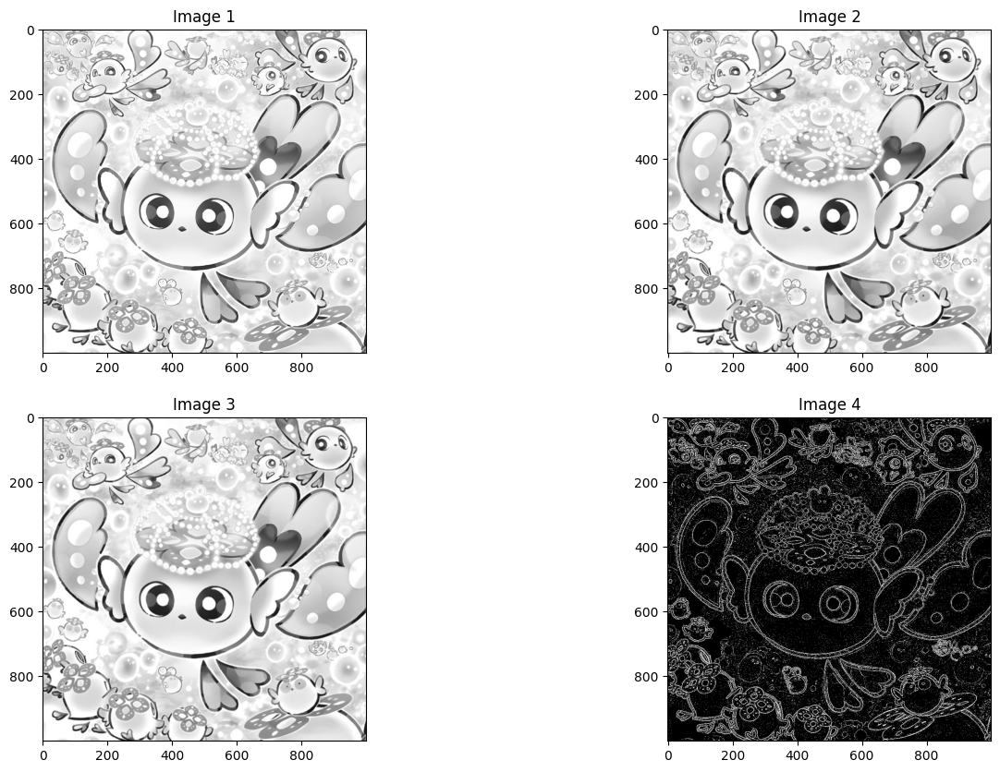

In [53]:
gaussian_1 = cv.GaussianBlur(img1_gray, (3, 3), 1)
gaussian_2 = cv.GaussianBlur(img1_gray, (3, 3), 2)

dog = gaussian_2 - gaussian_1

ShowFourImages(img1_gray, gaussian_1, gaussian_2, dog)



### Marr–Hildreth Edge Detector
The Marr–Hildreth method formalizes the idea of edge detection using zero-crossings of the second derivative, inspired by models of the human visual system.

It consists of three stages:

(1) Smooth the image using a Gaussian filter:

$$ I_s = G * I $$

(2) Apply the Laplacian operator to the smoothed image:

$$L = ∇²I_s$$

(3) Locate zero-crossings in L.

A pixel is considered part of an edge if its Laplacian value has neighbors with opposite signs:

$$ L(x, y) · L(x+1, y) < 0 $$

or similar checks horizontally, vertically, or diagonally.

Because the method relies on zero-crossings, it tends to produce thick edges and may generate false edges if σ is not chosen carefully. Nevertheless, it provides a clean theoretical framework rooted in signal processing and perception theory.

In [54]:
import cv2 as cv
import numpy as np

def marr_hildreth_edge(image, sigma=1.4, zero_cross_thresh=0.01):
    """
    Marr–Hildreth edge detector (LoG + zero-crossing).

    image : uint8 BGR hoặc grayscale
    sigma : độ lệch chuẩn Gaussian
    zero_cross_thresh : ngưỡng chênh lệch Laplacian cho zero-crossing
    """
    if image.ndim == 3:
        gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
        gray = image.copy()

    gray = gray.astype(np.float32) / 255.0

    ksize = int(6 * sigma + 1)
    if ksize % 2 == 0:
        ksize += 1

    blurred = cv.GaussianBlur(gray, (ksize, ksize), sigmaX=sigma, sigmaY=sigma)

    lap = cv.Laplacian(blurred, ddepth=cv.CV_32F, ksize=3)

    h, w = lap.shape
    edges = np.zeros((h, w), dtype=np.uint8)

    shifts = [
        (0, 1), (0, -1), (1, 0), (-1, 0),
        (1, 1), (1, -1), (-1, 1), (-1, -1)
    ]

    for dy, dx in shifts:
        shifted = np.roll(lap, shift=dy, axis=0)
        shifted = np.roll(shifted, shift=dx, axis=1)

        zero_cross = (lap * shifted) < 0
        contrast = np.abs(lap - shifted) > zero_cross_thresh
        edges = np.logical_or(edges, np.logical_and(zero_cross, contrast))

    return (edges.astype(np.uint8) * 255)


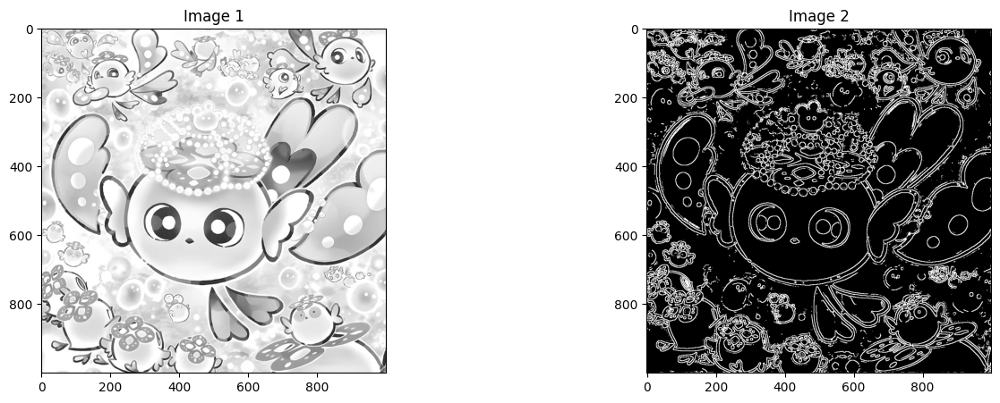

In [55]:
edges_mh = marr_hildreth_edge(img1_gray, sigma=2.0, zero_cross_thresh=0.02)

ShowTwoImages(img1_gray, edges_mh)

## **Canny edge detection**




The Canny edge detector is an edge detection operator that uses a multi-stage algorithm to detect a wide range of edges in images. It was developed by John F. Canny in 1986. Canny also produced a computational theory of edge detection explaining why the technique works. (Wikipedia)

The Canny edge detection algorithm is composed of 5 steps:

1. Noise reduction;
2. Gradient calculation;
3. Non-maximum suppression;
4. Double threshold;
5. Edge Tracking by Hysteresis.

In [56]:
edges_canny_gray_1 = feature.canny(img3_gray, sigma=2)
edges_canny_gray_2 = feature.canny(img3_gray, sigma=0.1)

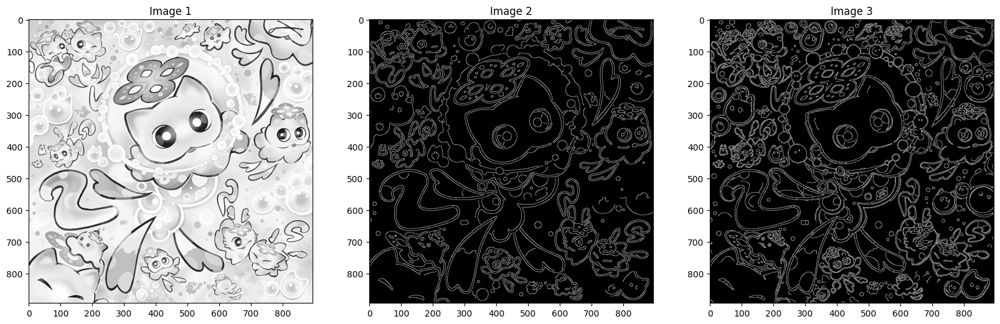

In [57]:
ShowThreeImages(img3_gray, edges_canny_gray_1, edges_canny_gray_2)

# Homework

## 1. Select an image from external sources and apply all the methods described above.

## 2. Select a noisy image, then perform edge detection using all the methods.
  - Experiment with different levels of Gaussian blur before applying the Laplacian and Canny edge detectors.

## 3. First-Order Derivatives
  - Implement the gradient using central difference kernels (Write a function: return Gx, Gy). Using cv.filter2D with kernel:
    - kx = [[-0.5, 0, 0.5]]
    - ky = [[-0.5], [0], [0.5]]
  - Display Gx, Gy, and mag side-by-side.
  - Describe how central differences behave on smooth vs. textured regions.
  

## 4. Laplacian Method (Second–Order Derivative Methods)

  - Write a function to implement the Laplacian method using Use the formula:

```python
cv2.Laplacian
```
  - Implement the LoG kernel directly using mathematics. Using the formular
  
$$LoG(x,y)= \frac{x^2 + y^2 - 2σ^2}{σ^4} e^{-\frac{x^2+y^2}{2σ^2}}$$
    
      - Compare: LoG made by “Gaussian → Laplacian” and LoG made by formula
  
  - DoG: test different (sigma1, sigma2) pairs and observe how scale affects edge detection.

  - Apply thresholding to create a simple edge map:
```python
edges = (np.abs(lap) > 0.1).astype(np.uint8) * 255
# in this case, threshold is 0.1 (using another one)
```

## 5. Canny Edge Detection
  - Re-implement the Canny edge detection method using

```python
cv2.Canny
```
  - Implement Full Canny From Scratch
    - Describe differences between custom vs OpenCV.
  - Mini-Canny: Blur + Gradient + Magnitude Threshold.
  Steps:
      - Apply Gaussian blur
      - Compute Sobel gradients
      - Compute magnitude
      - Apply simple threshold

  - Perform edge detection on an RGB (color) image. Write a function to apply this.

  - Additionally, re-write the Canny edge detection algorithm from scratch, without using built-in functions. Apply it to the images above and provide your observations.



## 6. Report

  - Display the original image alongside all processed images.
  - Compare the edges detected by the Laplacian method the Canny method (both built-in and custom implementation).
  - Write a short commentary comparing the visual differences between the methods, and describe your observations for each transformation.

---------------------------------------------------------

## 2. Select a noisy image, then perform edge detection using all the methods.
  - Experiment with different levels of Gaussian blur before applying the Laplacian and Canny edge detectors.

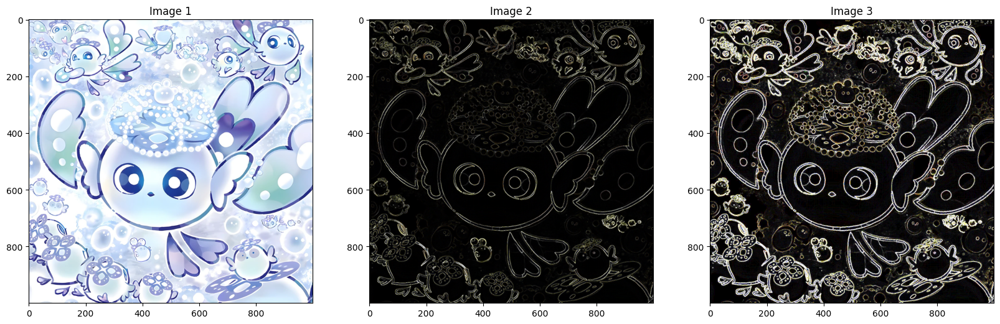

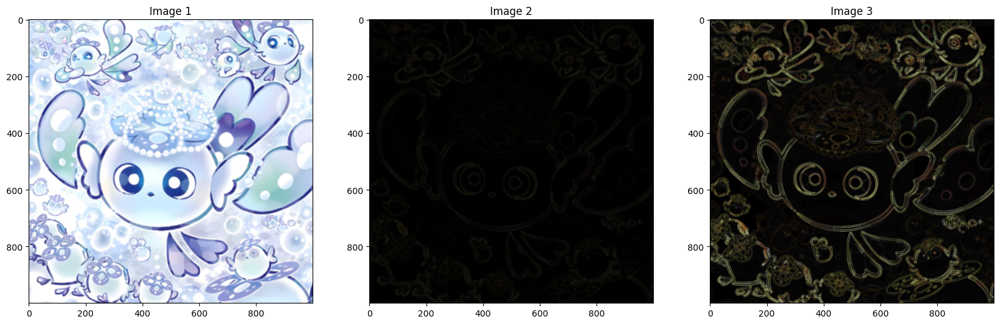

In [58]:
blurred_img1 = cv.GaussianBlur(img1, (5, 5), 5)

laplacian_kernel_1 = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
laplacian_kernel_2 = np.array([[1, 4, 1], [4, -20, 4], [1, 4, 1]])

laplacian_img1 = cv.filter2D(img1, ddepth=cv.CV_64F, kernel=laplacian_kernel_1)
laplacian_img1_blurred = cv.filter2D(blurred_img1, ddepth=cv.CV_64F, kernel=laplacian_kernel_1)

laplacian_img1 = cv.convertScaleAbs(laplacian_img1)
laplacian_img1_blurred = cv.convertScaleAbs(laplacian_img1_blurred)

laplacian_img2 = cv.filter2D(img1, ddepth=cv.CV_64F, kernel=laplacian_kernel_2)
laplacian_img2_blurred = cv.filter2D(blurred_img1, ddepth=cv.CV_64F, kernel=laplacian_kernel_2)

laplacian_img2 = cv.convertScaleAbs(laplacian_img2)
laplacian_img2_blurred = cv.convertScaleAbs(laplacian_img2_blurred)

ShowThreeImages(img1, laplacian_img1, laplacian_img2)
ShowThreeImages(blurred_img1, laplacian_img1_blurred, laplacian_img2_blurred)

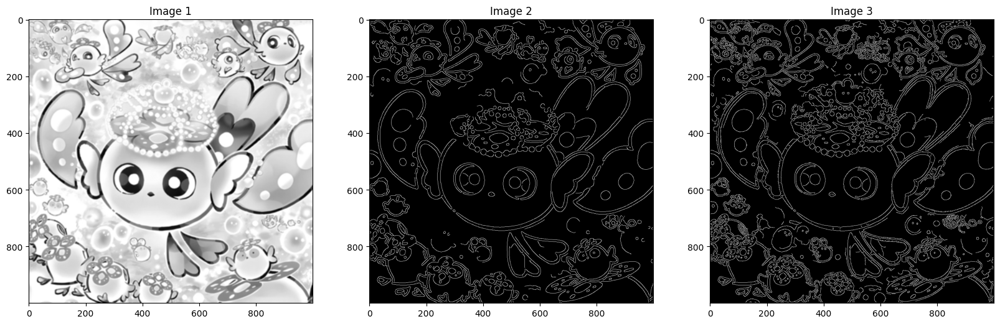

In [59]:
blurred_img1_gray = cv.cvtColor(blurred_img1, cv.COLOR_RGB2GRAY)

edges_canny_gray_1 = feature.canny(blurred_img1_gray, sigma=2)
edges_canny_gray_2 = feature.canny(blurred_img1_gray, sigma=0.1)

ShowThreeImages(blurred_img1_gray, edges_canny_gray_1, edges_canny_gray_2)

## 3. First-Order Derivatives
  - Implement the gradient using central difference kernels (Write a function: return Gx, Gy). Using cv.filter2D with kernel:
    - kx = [[-0.5, 0, 0.5]]
    - ky = [[-0.5], [0], [0.5]]
  - Display Gx, Gy, and mag side-by-side.
  - Describe how central differences behave on smooth vs. textured regions.

In [60]:
def new_gradient(img):
    kx = np.array([-0.5, 0, 0.5], dtype=np.float32)
    ky = np.array([[-0.5],
                    [0],
                    [0.5]], dtype=np.float32)

    Gx = cv.filter2D(img, cv.CV_64F, kx)
    Gy = cv.filter2D(img, cv.CV_64F, ky)
    return Gx, Gy

In [61]:
Gx, Gy = new_gradient(img1)
print(Gx)
print(Gy)
print(cv.magnitude(Gx, Gy))

[[[  0.    0.    0. ]
  [  0.    0.    0. ]
  [  0.    0.    0. ]
  ...
  [  0.    0.    0. ]
  [  0.    0.    0. ]
  [  0.    0.    0. ]]

 [[  0.5   0.5   0.5]
  [  0.5   0.5   0.5]
  [  0.5   0.5   0.5]
  ...
  [  0.    0.    0. ]
  [  0.    0.    0. ]
  [  0.    0.    0. ]]

 [[  0.5   0.5   0.5]
  [  0.5   0.5   0.5]
  [  0.5   0.5   0.5]
  ...
  [  0.    0.    0. ]
  [  0.    0.    0. ]
  [  0.    0.    0. ]]

 ...

 [[  0.    0.    0. ]
  [  0.    0.    0. ]
  [  0.    0.    0. ]
  ...
  [ 61.   51.   40.5]
  [ 48.5  38.5  32. ]
  [ 32.5  22.   15.5]]

 [[  0.    0.    0. ]
  [  0.    0.    0. ]
  [  0.    0.    0. ]
  ...
  [ 32.5  23.   18. ]
  [  4.5  -3.5 -10. ]
  [  0.5  -6.   -8. ]]

 [[  0.    0.    0. ]
  [  0.    0.    0. ]
  [  0.    0.    0. ]
  ...
  [  0.    0.    0. ]
  [  0.    0.    0. ]
  [  0.    0.    0. ]]]
[[[  0.    0.    0. ]
  [  0.    0.    0. ]
  [  0.    0.    0. ]
  ...
  [  0.    0.    0. ]
  [  0.    0.    0. ]
  [  0.    0.    0. ]]

 [[  0.5   0.5

=>

## 4. Laplacian Method (Second–Order Derivative Methods)

  - Write a function to implement the Laplacian method using Use the formula:

```python
cv2.Laplacian
```
  - Implement the LoG kernel directly using mathematics. Using the formular
  
$$LoG(x,y)= \frac{x^2 + y^2 - 2σ^2}{σ^4} e^{-\frac{x^2+y^2}{2σ^2}}$$
    
      - Compare: LoG made by “Gaussian → Laplacian” and LoG made by formula
  
  - DoG: test different (sigma1, sigma2) pairs and observe how scale affects edge detection.

  - Apply thresholding to create a simple edge map:
```python
edges = (np.abs(lap) > 0.1).astype(np.uint8) * 255
# in this case, threshold is 0.1 (using another one)
```


In [62]:
def Laplacian_method(img):
    return cv.Laplacian(img, ddepth=cv.CV_32F, ksize=3)

def LoG(sigma, size):
    x, y = np.meshgrid(np.arange(-size//2, size//2 + 1), 
                       np.arange(-size//2, size//2 + 1))
    kernel = (x**2 + y**2 - 2 * sigma**2) / (sigma**4) * np.exp(-(x**2 + y**2) / (2 * sigma**2))
    return kernel - np.mean(kernel)

def DoG(img, sigma1, sigma2, ksize):
    return cv.GaussianBlur(img, (ksize, ksize), sigma1) - cv.GaussianBlur(img, (ksize, ksize), sigma1)

def threshol(img, threshold_ratio=0.2):
    abs_image = np.abs(img)
    threshold_value = threshold_ratio * np.max(abs_image)
    
    edges = (abs_image > threshold_value).astype(np.uint8) * 255
    return edges

## 5. Canny Edge Detection
  - Re-implement the Canny edge detection method using

```python
cv2.Canny
```
  - Implement Full Canny From Scratch
    - Describe differences between custom vs OpenCV.
  - Mini-Canny: Blur + Gradient + Magnitude Threshold.
  Steps:
      - Apply Gaussian blur
      - Compute Sobel gradients
      - Compute magnitude
      - Apply simple threshold

  - Perform edge detection on an RGB (color) image. Write a function to apply this.

  - Additionally, re-write the Canny edge detection algorithm from scratch, without using built-in functions. Apply it to the images above and provide your observations.

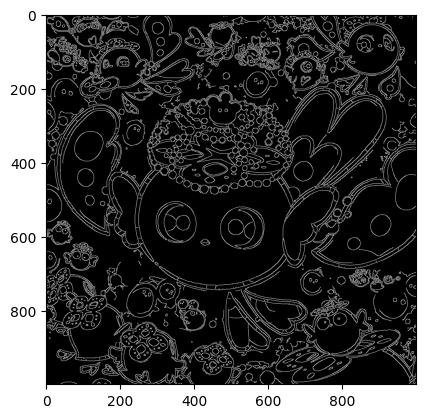

In [63]:
plt.imshow(cv.Canny(img1, 50 , 150),cmap='gray')
plt.show()

In [64]:
def mini_canny(img):
    img_gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

    blurred = cv.GaussianBlur(img_gray, (5, 5), 1.4)

    grad_x = cv.Sobel(blurred, cv.CV_64F, 1, 0, ksize=3)
    grad_y = cv.Sobel(blurred, cv.CV_64F, 0, 1, ksize=3)

    magnitude = np.hypot(grad_x, grad_y)
    magnitude = magnitude / magnitude.max() * 255

    _, edges = cv.threshold(magnitude.astype(np.uint8),100, 255, cv.THRESH_BINARY)
    
    return edges

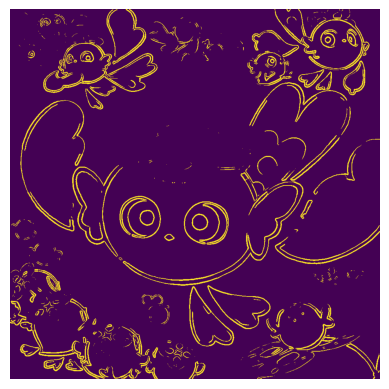

In [65]:
plt.imshow(mini_canny(img1))
plt.axis('off')
plt.show()

In [66]:
def color_edge_detection(image):

    edges_b = cv.Canny(img1[:,:,0], 100, 200)
    edges_g = cv.Canny(img1[:,:,1], 100, 200)
    edges_r = cv.Canny(img1[:,:,2], 100, 200)
    
    combined = np.maximum(np.maximum(edges_b, edges_g), edges_r)
    return combined

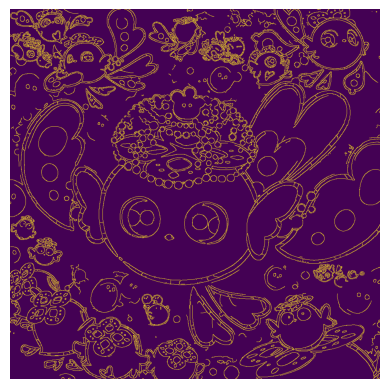

In [67]:
plt.imshow(color_edge_detection(img1))
plt.axis('off')
plt.show()

In [68]:
def Canny(img, low_threshold=30, high_threshold=100):
    img_gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
    #1. Noise reduction
    blurred = cv.GaussianBlur(img_gray, (5, 5), 1.4)
    #2. Gradient calculation
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)
    Ix = cv.filter2D(blurred, cv.CV_64F, Kx)
    Iy = cv.filter2D(blurred, cv.CV_64F, Ky)

    magnitude = np.hypot(Ix, Iy)
    magnitude = magnitude / magnitude.max() * 255
    theta = np.arctan2(Iy, Ix)

    #3. Non-maximum suppression
    M, N = magnitude.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = theta * 180. / np.pi
    angle[angle < 0] += 180

    for i in range(1, M-1):
        for j in range(1, N-1):
            try:
                q = 255
                r = 255
                
                # Angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = magnitude[i, j+1]
                    r = magnitude[i, j-1]
                # Angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = magnitude[i+1, j-1]
                    r = magnitude[i-1, j+1]
                # Angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = magnitude[i+1, j]
                    r = magnitude[i-1, j]
                # Angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = magnitude[i-1, j-1]
                    r = magnitude[i+1, j+1]

                if (magnitude[i,j] >= q) and (magnitude[i,j] >= r):
                    Z[i,j] = magnitude[i,j]
                else:
                    Z[i,j] = 0

            except IndexError:
                pass
    
    nms_img = Z.astype(np.uint8)
    #4. Double threshold
    res = np.zeros((M,N), dtype=np.int32)
    weak = np.int32(25)
    strong = np.int32(255)
    
    strong_i, strong_j = np.where(nms_img >= high_threshold)
    zeros_i, zeros_j = np.where(nms_img < low_threshold)
    weak_i, weak_j = np.where((nms_img <= high_threshold) & (nms_img >= low_threshold))
    
    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak
    #5. Edge Tracking by Hysteresis
    dx = [-1, -1, 0, 1, 1, 1, 0, -1]
    dy = [0, 1, 1, 1, 0, -1, -1, -1]
    
    stack = list(zip(strong_i, strong_j))
    
    while stack:
        x, y = stack.pop()
        for k in range(8):
            nx, ny = x + dx[k], y + dy[k]
            if 0 <= nx < M and 0 <= ny < N:
                if res[nx, ny] == weak:
                    res[nx, ny] = strong
                    stack.append((nx, ny))
    
    for i in range(M):
        for j in range(N):
            if res[i,j] == weak:
                res[i,j] = 0
                
    return res.astype(np.uint8)

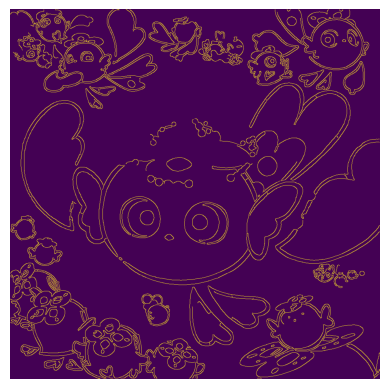

In [69]:
plt.imshow(Canny(img1))
plt.axis('off')
plt.show()